<img align="left" src=https://project.lsst.org/sites/default/files/Rubin-O-Logo_0.png width=200 style="padding: 10px">
<br>
<b>Operations Rehearsal Analysis Notebook</b> <br>
Contact author: Meredith Rawls<br>
Last verified to run: June 28, 2024<br>
LSST Science Piplines version: w_2024_22<br>
Container Size: Large <br>

# PREOPS-5029: Reasonableness-check Ops Rehearsal 3 DiaSources in APDB+butler datasets

This notebook is designed to be run on a pair of DIA data products, one from e.g. prompt processing (AP Pipeline) and one from e.g. daily/nightly validation processing (DRP pipeline).

It does not currently work for OR4 for a few reasons:

* OR4 did not create DIA data products during the daily/nightly validation pipeline
* The OR3 APDB is an older version that requires w_2024_22 or earlier to load correctly
* The OR4 APDB uses Cassandra, not Postgres

## Table of Contents

1. [AP Pipeline data access (PP)](#section_1)
2. [DRP Pipeline data access (DV)](#section_2)
3. [Find DIA related datasetTypes and look at diaSourceTables](#section_3)
4. [Make some diaSource cutout plots](#section_4)
5. [Assess agreement between PP and DV diaSource statistics](#section_5)
6. [diaSource distribution spot check](#section_6)

In [1]:
%matplotlib widget

In [2]:
import numpy as np
import pyarrow as pa
from sqlalchemy import func, select
import yaml
import functools
import operator
import matplotlib.pyplot as plt
import pandas as pd
from astropy.visualization import ZScaleInterval, SqrtStretch, ImageNormalize, MinMaxInterval, LogStretch
from astropy.table import Table, join
import lsst.daf.butler as dafButler
from lsst.daf.butler import DatasetNotFoundError
from lsst.pipe.base import Instrument
from lsst.analysis.ap import apdb
from lsst.analysis.ap import legacyPlotUtils as pla
from lsst.analysis.ap import PlotImageSubtractionCutoutsConfig, PlotImageSubtractionCutoutsTask
import lsst.afw.display as afwDisplay
import lsst.display.astrowidgets
afwDisplay.setDefaultBackend('astrowidgets')

## 1. <a id="section_1">AP Pipeline data access (PP)</a>
We'll call this one `pp` for "prompt processing"

In [3]:
repo = '/repo/embargo'
instrument = 'LSSTComCamSim'
url = 'rubin@usdf-prompt-processing-dev.slac.stanford.edu/lsst-devl'
pp_collections = ['u/elhoward/DM-44138/LSSTComCamSim']
namespace = 'elhoward_dm44138_LSSTComCamSim'

In [4]:
pp_butler = dafButler.Butler(repo, collections=pp_collections, instrument=instrument)

In [5]:
pp_apdb = apdb.ApdbPostgresQuery(url=url, namespace=namespace, instrument=instrument)

## 2. <a id="section_2">DRP Pipeline data access (DV)</a>

We'll call this one `dv` for "daily validation"

In [6]:
skymap = 'ops_rehersal_prep_2k_v1'
steps1_and_2a_collections = 'LSSTComCamSim/quickLook/24'
night1_collections = 'LSSTComCamSim/runs/nightlyvalidation/20240402/d_2024_03_29/DM-43612'
night2_collections = 'LSSTComCamSim/runs/nightlyvalidation/20240403/d_2024_03_29/DM-43612'
night3_collections = 'LSSTComCamSim/runs/nightlyvalidation/20240404/d_2024_03_29/DM-43612'
dv_collections = [night1_collections,night2_collections,night3_collections]

In [7]:
dv_butler = dafButler.Butler(repo, collections=dv_collections, instrument=instrument, skymap=skymap)

## 3. <a id="section_3">Find DIA related datasetTypes and look at diaSourceTables</a>

We'll look in both the PP and DV butler and collections, and get a subset of valid patch+tracts and constituent detector+visits for further investigations.

In [8]:
def printExistingDatasetTypes(butler, collections):
    """List datasetTypes that exist in a given Butler and collections."""
    registry = butler.registry
    for datasetType in registry.queryDatasetTypes():
        if registry.queryDatasets(datasetType, collections=collections).any(execute=False, exact=False):
            # Limit search results to the data products
            if ('_config' not in datasetType.name) and ('_log' not in datasetType.name) and \
               ('_metadata' not in datasetType.name) and ('_resource_usage' not in datasetType.name) and \
               ('dia' in datasetType.name or 'Dia' in datasetType.name or 'goodSeeingDiff' in datasetType.name):
                print(datasetType)

In [9]:
printExistingDatasetTypes(pp_butler, pp_collections)

DatasetType('goodSeeingDiff_differenceTempExp', {band, instrument, day_obs, detector, physical_filter, visit}, ExposureF)
DatasetType('goodSeeingDiff_diaSrc', {band, instrument, day_obs, detector, physical_filter, visit}, SourceCatalog)
DatasetType('goodSeeingDiff_diaSrcTable', {band, instrument, day_obs, detector, physical_filter, visit}, DataFrame)
DatasetType('goodSeeingDiff_differenceExp', {band, instrument, day_obs, detector, physical_filter, visit}, ExposureF)
DatasetType('goodSeeingDiff_matchedExp', {band, instrument, day_obs, detector, physical_filter, visit}, ExposureF)
DatasetType('goodSeeingDiff_templateExp', {band, instrument, day_obs, detector, physical_filter, visit}, ExposureF)
DatasetType('goodSeeingDiff_diaSrc_schema', {}, SourceCatalog)
DatasetType('goodSeeingDiff_longTrailedSrc', {band, instrument, day_obs, detector, physical_filter, visit}, DataFrame)
DatasetType('goodSeeingDiff_candidateDiaSrc', {band, instrument, day_obs, detector, physical_filter, visit}, SourceC

In [10]:
printExistingDatasetTypes(dv_butler, dv_collections)

DatasetType('goodSeeingDiff_differenceTempExp', {band, instrument, day_obs, detector, physical_filter, visit}, ExposureF)
DatasetType('goodSeeingDiff_diaSrc', {band, instrument, day_obs, detector, physical_filter, visit}, SourceCatalog)
DatasetType('goodSeeingDiff_diaSrcTable', {band, instrument, day_obs, detector, physical_filter, visit}, DataFrame)
DatasetType('goodSeeingDiff_differenceExp', {band, instrument, day_obs, detector, physical_filter, visit}, ExposureF)
DatasetType('goodSeeingDiff_matchedExp', {band, instrument, day_obs, detector, physical_filter, visit}, ExposureF)
DatasetType('goodSeeingDiff_templateExp', {band, instrument, day_obs, detector, physical_filter, visit}, ExposureF)
DatasetType('goodSeeingDiff_diaSrc_schema', {}, SourceCatalog)
DatasetType('diaSourceTable_tract', {skymap, tract}, DataFrame)
DatasetType('goodSeeingDiff_assocDiaSrcTable', {skymap, tract, patch}, DataFrame)
DatasetType('mergedForcedSourceOnDiaObject', {band, instrument, skymap, day_obs, detector

### Choose a small set of tract+patch and visit+detector for a closer look

We'll use tract 9813, patches 180 and 181 from DRP, and then get the constituent visit+detectors, which should be valid for both the DRP and the AP pipelines.

In [8]:
# assumes we are considering one tract at a time
dvDataIds = [{'tract': 9813, 'patch': 180}, {'tract': 9813, 'patch': 181}]#, {'tract': 9813, 'patch': 182}]
tract = dvDataIds[0]['tract']
patches = str(tuple(set([dataId['patch'] for dataId in dvDataIds])))
where_clause = f"skymap='{skymap}' AND tract={tract} AND patch IN {patches}"
result = list(dv_butler.registry.queryDatasets('goodSeeingDiff_diaSrcTable', collections=dv_collections, where=where_clause))

In [9]:
ppDataIds = []
for item in result:
    visit = item.dataId['visit']
    detector = item.dataId['detector']
    ppDataId = {'visit': visit, 'detector': detector}
    ppDataIds.append(ppDataId)

In [10]:
ppDataIds_unique = list(map(dict, set(tuple(sorted(sub.items())) for sub in ppDataIds)))

In [11]:
print(len(ppDataIds))
print(len(ppDataIds_unique))

2901
916


In [12]:
# verify that the list looks reasonable and we can cut it down to not-super-long
for dataId in ppDataIds_unique[::40]:
    print(dataId)

{'detector': 8, 'visit': 7024040300197}
{'detector': 8, 'visit': 7024040400112}
{'detector': 8, 'visit': 7024040200236}
{'detector': 2, 'visit': 7024040400231}
{'detector': 5, 'visit': 7024040400108}
{'detector': 7, 'visit': 7024040300230}
{'detector': 1, 'visit': 7024040300099}
{'detector': 2, 'visit': 7024040300075}
{'detector': 5, 'visit': 7024040400234}
{'detector': 8, 'visit': 7024040300067}
{'detector': 5, 'visit': 7024040200077}
{'detector': 5, 'visit': 7024040400118}
{'detector': 2, 'visit': 7024040200063}
{'detector': 1, 'visit': 7024040400224}
{'detector': 5, 'visit': 7024040400062}
{'detector': 2, 'visit': 7024040400065}
{'detector': 8, 'visit': 7024040400119}
{'detector': 1, 'visit': 7024040200103}
{'detector': 1, 'visit': 7024040400099}
{'detector': 5, 'visit': 7024040400201}
{'detector': 8, 'visit': 7024040400200}
{'detector': 5, 'visit': 7024040300210}
{'detector': 4, 'visit': 7024040300227}


### Look at the diaSource counts to see if the diaSourceTables differ

This is all unique visit+detectors that went into (tract,patch) = (9813,180) and (9813,181).

In [12]:
pp_lengths = []
dv_lengths = []
for dataId in ppDataIds_unique:
    pp_oneDiaSrcTable = pp_butler.get('goodSeeingDiff_diaSrcTable', dataId=dataId)
    dv_oneDiaSrcTable = dv_butler.get('goodSeeingDiff_diaSrcTable', dataId=dataId)
    pp_lengths.append(len(pp_oneDiaSrcTable))
    dv_lengths.append(len(dv_oneDiaSrcTable))

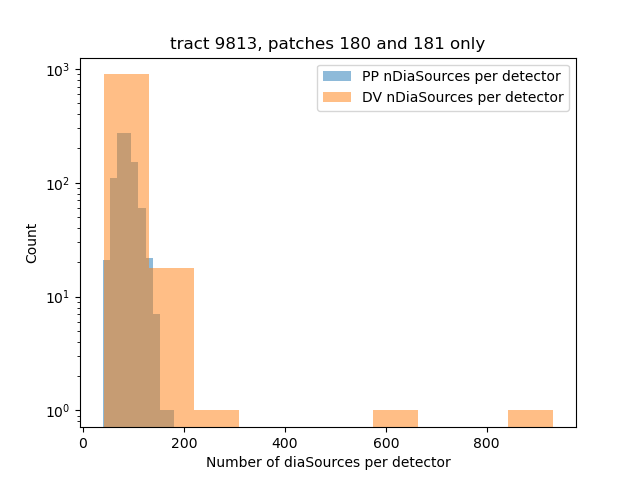

In [15]:
plt.figure()
plt.hist(pp_lengths, label='PP nDiaSources per detector', alpha=0.5, log=True)
plt.hist(dv_lengths, label='DV nDiaSources per detector', alpha=0.5, log=True)
plt.xlabel('Number of diaSources per detector')
plt.ylabel('Count')
plt.title('tract 9813, patches 180 and 181 only')
plt.legend()
plt.show()

In [14]:
print(np.median(dv_lengths))
print(np.median(pp_lengths))

82.0
84.0


## 4. <a id="section_4">Make some diaSource cutout plots</a>

These will be saved to disk as PNGs. **Note that DM-44609 (analysis_ap) is needed for this section to work.**

### Create cutout plots for DRP diaSrcTables

In [19]:
cutoutConfigDrp = PlotImageSubtractionCutoutsConfig()  # default is calexp, which is correct for DRP still

In [20]:
cutoutTaskDrp = PlotImageSubtractionCutoutsTask(config=cutoutConfigDrp,
                                                output_path='/sdf/data/rubin/user/mrawls/diffim-cutouts-or3/drp-daily-validation')

In [21]:
for dataId in ppDataIds_unique[::40]:
    try:
        dv_diaSourceTable = dv_butler.get('goodSeeingDiff_diaSrcTable', dataId=dataId)
    except DatasetNotFoundError:
        print(f'Could not load DV diaSrcTable for {dataId}')
        continue
    else:
        # manually add required columns to the diaSrcTable and run the cutout task
        dv_diaSourceTable['instrument'] = instrument
        dv_diaSourceTable['detector'] = dataId['detector']
        dv_diaSourceTable['visit'] = dataId['visit']
        cutoutTaskDrp.run(dv_diaSourceTable, dv_butler)

### Create cutout plots for AP diaSrcTables

In [22]:
cutoutConfigAp = PlotImageSubtractionCutoutsConfig(science_image_type='initial_pvi')

In [24]:
cutoutTaskAp = PlotImageSubtractionCutoutsTask(config=cutoutConfigAp,
                                               output_path='/sdf/data/rubin/user/mrawls/diffim-cutouts-or3/ap-prompt-processing')

In [25]:
for dataId in ppDataIds_unique[::40]:
    try:
        pp_diaSourceTable = pp_butler.get('goodSeeingDiff_diaSrcTable', dataId=dataId)
    except DatasetNotFoundError:
        print(f'Could not load PP diaSrcTable for {dataId}')
        continue
    else:
        # manually add required column to the diaSrcTable and run the cutout task
        pp_diaSourceTable['instrument'] = instrument
        cutoutTaskAp.run(pp_diaSourceTable, pp_butler)

### Side quest: troubleshoot cutout centroid positions

Sometimes the centroid of the cutout does not appear to align with the diaSource, so I did some initial investigation into that issue here.

In [26]:
onediffim = pp_butler.get('goodSeeingDiff_differenceExp', visit=7024040200227, detector=4)
oneDiaSrc = pp_butler.get('goodSeeingDiff_diaSrc', visit=7024040200227, detector=4)

In [28]:
oneDiaSrc[oneDiaSrc['id'] == 3065438661995659316][0]

<class 'lsst.afw.table.SourceRecord'>
id: 3065438661995659316
coord_ra: 2.61689 rad
coord_dec: 0.0372087 rad
parent: 0
coord_raErr: 2.47592e-07
coord_decErr: 2.78085e-07
coord_ra_dec_Cov: -2.02549e-14
flags_negative: 0
deblend_nChild: 0
deblend_deblendedAsPsf: 0
deblend_psfCenter_x: nan
deblend_psfCenter_y: nan
deblend_psf_instFlux: nan
deblend_tooManyPeaks: 0
deblend_parentTooBig: 0
deblend_masked: 0
deblend_failed: 0
deblend_skipped: 0
deblend_rampedTemplate: 0
deblend_patchedTemplate: 0
deblend_hasStrayFlux: 0
deblend_peak_center_x: 0
deblend_peak_center_y: 0
deblend_peakId: 0
deblend_nPeaks: 0
deblend_parentNPeaks: 0
detect_isPrimary: 0
detect_isDeblendedSource: 0
detect_fromBlend: 0
detect_isIsolated: 0
base_SdssCentroid_x: 1146.53
base_SdssCentroid_y: 1490.8
base_SdssCentroid_xErr: 0.311193
base_SdssCentroid_yErr: 0.224858
base_SdssCentroid_flag: 0
base_SdssCentroid_flag_edge: 0
base_SdssCentroid_flag_noSecondDerivative: 0
base_SdssCentroid_flag_almostNoSecondDerivative: 0
base_S

In [29]:
one_pp_diaSourceTable = pp_butler.get('goodSeeingDiff_diaSrcTable', visit=7024040200227, detector=4)

In [30]:
onediffim = pp_butler.get('goodSeeingDiff_differenceExp', visit=7024040200227, detector=4)
oneDiaSrc = pp_butler.get('goodSeeingDiff_diaSrc', visit=7024040200227, detector=4)

In [31]:
example_pandas = one_pp_diaSourceTable.loc[one_pp_diaSourceTable['diaSourceId'] == 3065438661995659316]

In [32]:
coord = lsst.geom.SpherePoint(example_pandas['ra'].values, example_pandas['dec'].values, lsst.geom.degrees)

In [33]:
coord

SpherePoint(149.93647479659273*degrees, 2.131899548740507*degrees)

In [34]:
newpoint = onediffim.wcs.skyToPixel(coord)

In [35]:
newpoint

Point2D(1146.525389302114, 1490.7999422430228)

In [36]:
display1 = afwDisplay.Display(dims=(400,400))
display1.setMaskTransparency(50)
display1.mtv(onediffim)
display1.centroids(oneDiaSrc, symbol='x', size=10, ctype='cyan')
example = oneDiaSrc[oneDiaSrc['id'] == 3065438661995659316]
display1.centroids(example, symbol='+', size=20, ctype='red')
#display1.dot('o', 1146.53, 1490.8, size=5, ctype='yellow')
#display1.dot('o', point.getX(), point.getY(), size=7, ctype='green')
display1.embed()

ImageWidget(children=(Image(value=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\x…

## 5. <a id="section_5">Assess agreement between PP and DV diaSource statistics</a>

First, a diaSourceCounter function that uses the `goodSeeingDiff_assocDiaSrcTable` data product to retrieve associated diaSources per patch in DV. I want the output of `drpAssociation` to be able to compare to the APDB (since APDB diaSources come out of `ap_association`). Therefore, we have to deal with tracts and patches. On the plus side, this could be turned into a useful per-tract-and-patch metric later.

Second, a query that retrieves associated diaSources from the APDB in PP. I had to learn some sqlalchemy, that was a journey.

We'll consider only "good" diaSources in both cases, i.e., those with none of the following flags (determining if this list is optimal is out of scope for this investigation):

* pixelFlags_edge
* pixelFlags_bad
* pixelFlags_suspect
* pixelFlags_interpolatedCenter
* pixelFlags_saturatedCenter

In [14]:
# Function for use on the DV (patch+tract) data products

def diaSourceCounter(butler, instrument, tract, patch,
                     badFlagList=['pixelFlags_edge', 'pixelFlags_bad', 'pixelFlags_suspect',
                                  'pixelFlags_interpolatedCenter', 'pixelFlags_saturatedCenter', ],
                     doPrintResults=False,
                     doMakePlot=False):
    """Count the number of diaSources in a goodSeeingDiff_assocDiaSrcTable
    as well as the number of consituent visit+detector dataIds that went into it.
    Return the ratio, as a measure of "how many diaSources are there per visit+detector?"
    """
    df = butler.get('goodSeeingDiff_assocDiaSrcTable', tract=tract, patch=patch)
    nDiaSources = len(df)

    badFlags = [df[flag] for flag in badFlagList]
    flagFilter = functools.reduce(operator.or_, badFlags)
    noFlagFilter = ~flagFilter
    nDiaSources_good = len(df.loc[noFlagFilter])
    
    instrumentDataId = butler.registry.expandDataId(instrument=instrument)
    packer = Instrument.from_data_id(instrumentDataId).make_default_dimension_packer(data_id=instrumentDataId, is_exposure=False)
    
    visitDetectorList = []
    #print(tract, patch)
    for row in df['ccdVisitId'].values:
        visitDetector = packer.unpack(row)
        visitDetectorList.append(visitDetector)
    visitDetectorList_unique = set(visitDetectorList)
    nVisitDetectors = len(visitDetectorList_unique)
    diaSourcePerVisitDetector = nDiaSources_good / nVisitDetectors

    dfObj = butler.get('goodSeeingDiff_diaObjTable', tract=tract, patch=patch)
    nDiaObjects = len(dfObj)
    nDiaObjectsWithOneDiaSource = len(dfObj.loc[dfObj.nDiaSources==1])
    
    if doPrintResults:
        print(f'There are {nDiaSources} total diaSources')
        print(f'There are {nDiaSources_good} "good" diaSources')
        print(f'There are {nVisitDetectors} unique visit+detectors')
        print(f'There are {diaSourcePerVisitDetector:.1f} "good" diaSources per dataId that went into this tract+patch')
        print(f'There are {nDiaObjects} total diaObjects')
        print(f'\t The diaObject with the most diaSources has {np.max(dfObj.nDiaSources)} diaSources')
        print(f'\t and {nDiaObjectsWithOneDiaSource} ({nDiaObjectsWithOneDiaSource/nDiaObjects*100:.1f}%) diaObjects have just 1 diaSource')        
    
    if doMakePlot:
        band = 'i'
        try:
            coadd = butler.get('goodSeeingCoadd', tract=tract, patch=patch, band=band)
        except DatasetNotFoundError:  # load r-band instead
            band = 'r'
            coadd = butler.get('goodSeeingCoadd', tract=tract, patch=patch, band=band)

        plt.figure(figsize=(6,6))
        ax1 = plt.gca()
        coadd.setXY0(lsst.geom.Point2I(0,0))  # so we can plot everything in naive patch xycoords
        xycoords = coadd.wcs.skyToPixelArray(ra=dfObj['ra'], dec=dfObj['dec'], degrees=True)
        norm = ImageNormalize(coadd.image.array, interval=ZScaleInterval(), stretch=SqrtStretch())
        ax1.imshow(coadd.image.array, origin='lower', norm=norm, cmap='gray', alpha=0.5)
        ax1.scatter(xycoords[0], xycoords[1], alpha=0.5, s=dfObj['nDiaSources']*10)
        plt.axis('off')
        plt.title(f'diaObjects in tract {tract}, patch {patch} (+ {band}-band goodSeeingCoadd)')
        plt.show()

    return nDiaSources_good, nVisitDetectors, diaSourcePerVisitDetector, visitDetectorList

In [15]:
validDataIdList = list(dv_butler.registry.queryDatasets('goodSeeingDiff_assocDiaSrcTable').dataIds)

In [16]:
len(validDataIdList)

1500

In [17]:
for dataId in validDataIdList[::15]:
    print(dataId.mapping['tract'], dataId.mapping['patch'])

2494 85
2494 138
2494 175
2494 210
2494 255
2495 101
2495 146
2495 169
2495 200
2495 231
2495 254
2495 288
2662 14
2662 47
3345 222
3345 274
3346 219
3346 251
3346 281
3384 22
3384 52
3384 73
3384 92
3384 111
3384 130
3384 153
3384 172
3384 192
3384 212
3385 83
3385 203
3533 17
3533 35
3533 54
3533 73
3533 92
3533 112
3533 140
3534 67
6914 158
6914 188
6914 209
6914 229
6914 249
6914 274
6915 218
6915 286
7149 14
7149 32
7149 56
7149 78
7445 52
7445 76
7445 104
7445 125
7445 145
7445 164
7445 187
7445 206
7445 226
7445 246
7445 276
7446 168
7683 1
9347 177
9347 206
9347 227
9347 247
9347 272
9348 220
9590 2
9590 22
9590 42
9590 62
9590 88
9590 110
9591 66
9638 281
9813 24
9813 48
9813 74
9813 92
9813 110
9813 128
9813 146
9813 164
9813 182
9813 200
9813 226
9813 249
9880 20
9880 39
9880 58
9880 76
9880 94
9880 112
9880 130
9880 149
9880 171
9880 192


### Run the diaSourceCounter for all valid dataIds first

In [18]:
dv_results = []
for dataId in validDataIdList:
    result = diaSourceCounter(butler=dv_butler, instrument=instrument, tract=dataId.mapping['tract'], patch=dataId.mapping['patch'])
    dv_results.append({'tract': dataId.mapping['tract'], 'patch': dataId.mapping['patch'], 'nDiaSources_good': result[0],
                       'nVisitDetectors': result[1],
                       'diaSourcePerVisitDetector': result[2]})

In [19]:
df_dv = pd.DataFrame(dv_results)

In [20]:
df_dv = pd.DataFrame(dv_results)

In [21]:
df_dv

,tract,patch,nDiaSources_good,nVisitDetectors,diaSourcePerVisitDetector
0,2494,85,188,7,26.857143
1,2494,86,286,6,47.666667
2,2494,87,84,3,28.000000
3,2494,102,3280,32,102.500000
4,2494,103,2958,25,118.320000
...,...,...,...,...,...
1495,9880,211,111,2,55.500000
1496,9880,212,112,2,56.000000
1497,9880,213,24,3,8.000000
1498,9880,214,32,2,16.000000


In [22]:
sum(df_dv.nDiaSources_good)

3945214

In [23]:
np.median(df_dv.diaSourcePerVisitDetector)

23.915652467883703

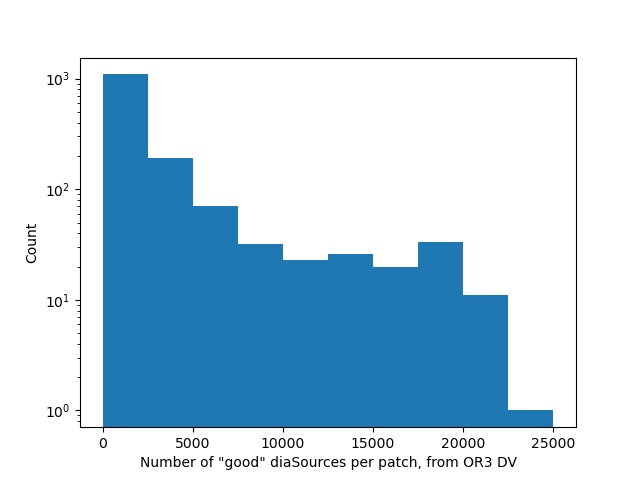

In [24]:
plt.figure()
plt.hist(df_dv.nDiaSources_good, log=True)
plt.xlabel('Number of "good" diaSources per patch, from OR3 DV')
plt.ylabel('Count')
plt.show()

In [25]:
sum(df_dv.nVisitDetectors)

89736

### Query the APDB to get info about all the diaSources to compare to the above

In [26]:
source_table_good = pp_apdb.load_sources(exclude_flagged=True, limit=1e6)

In [27]:
list(source_table_good.columns)

['diaSourceId',
 'visit',
 'detector',
 'diaObjectId',
 'ssObjectId',
 'parentDiaSourceId',
 'ssObjectReassocTime',
 'midpointMjdTai',
 'ra',
 'raErr',
 'dec',
 'decErr',
 'ra_dec_Cov',
 'x',
 'xErr',
 'y',
 'yErr',
 'x_y_Cov',
 'centroid_flag',
 'apFlux',
 'apFluxErr',
 'apFlux_flag',
 'apFlux_flag_apertureTruncated',
 'snr',
 'psfFlux',
 'psfFluxErr',
 'psfRa',
 'psfRaErr',
 'psfDec',
 'psfDecErr',
 'psfFlux_psfRa_Cov',
 'psfFlux_psfDec_Cov',
 'psfRa_psfDec_Cov',
 'psfLnL',
 'psfChi2',
 'psfNdata',
 'psfFlux_flag',
 'psfFlux_flag_edge',
 'psfFlux_flag_noGoodPixels',
 'trailFlux',
 'trailFluxErr',
 'trailRa',
 'trailRaErr',
 'trailDec',
 'trailDecErr',
 'trailLength',
 'trailLengthErr',
 'trailAngle',
 'trailAngleErr',
 'trailFlux_trailRa_Cov',
 'trailFlux_trailDec_Cov',
 'trailFlux_trailLength_Cov',
 'trailFlux_trailAngle_Cov',
 'trailRa_trailDec_Cov',
 'trailRa_trailLength_Cov',
 'trailRa_trailAngle_Cov',
 'trailDec_trailLength_Cov',
 'trailDec_trailAngle_Cov',
 'trailLength_trailAn

In [28]:
# GOAL: count number of diaSources per detector, via the diaSource table

DiaSource = pp_apdb._tables["DiaSource"]

diaSource_count_query = select(func.count("*")).select_from(DiaSource)
good_diaSource_count_query = select(func.count("*")).select_from(DiaSource). \
    where((DiaSource.c.pixelFlags_edge==False) & (DiaSource.c.pixelFlags_bad==False) & (DiaSource.c.pixelFlags_suspect==False)
    & (DiaSource.c.pixelFlags_interpolatedCenter==False) & (DiaSource.c.pixelFlags_saturatedCenter==False))
row_print_query = DiaSource.select().where(DiaSource.c.diaObjectId > 100).limit(5)

#query = sqlalchemy.select([
#    BOOKS.c.genre,
#    sqlalchemy.func.count(BOOKS.c.genre)
#]).group_by(BOOKS.c.genre)

unique_dataId_query = select(DiaSource.c.visit, DiaSource.c.detector, func.count("*")).\
    where((DiaSource.c.pixelFlags_edge==False) & (DiaSource.c.pixelFlags_bad==False) & (DiaSource.c.pixelFlags_suspect==False)
    & (DiaSource.c.pixelFlags_interpolatedCenter==False) & (DiaSource.c.pixelFlags_saturatedCenter==False)).\
    group_by(DiaSource.c.visit, DiaSource.c.detector)



In [40]:
with pp_apdb.connection as conn:
    nDiaSources = conn.execute(diaSource_count_query).fetchall()
    nGoodDiaSources = conn.execute(good_diaSource_count_query).fetchall()
    fiveRows = conn.execute(row_print_query).fetchall()
    nUniqueDataIds = conn.execute(unique_dataId_query).fetchall()
    print(f'{nDiaSources[0][0]} total diaSources')
    print(f'{nGoodDiaSources[0][0]} of those are "good" diaSources')
    print(f'Here are the first 20 unique (visit, detector) diaSource counts:')
    #for row in fiveRows:
    #    print(f'\n {row}')
    print(nUniqueDataIds[0:20])

10295175 total diaSources
10143735 of those are "good" diaSources
Here are the first 20 unique (visit, detector) diaSource counts:
[(7024040200001, 0, 198), (7024040200001, 1, 182), (7024040200001, 2, 204), (7024040200001, 3, 204), (7024040200001, 4, 179), (7024040200001, 5, 230), (7024040200001, 6, 191), (7024040200001, 7, 167), (7024040200001, 8, 201), (7024040200002, 0, 264), (7024040200002, 1, 290), (7024040200002, 2, 251), (7024040200002, 3, 272), (7024040200002, 4, 259), (7024040200002, 5, 292), (7024040200002, 6, 304), (7024040200002, 7, 283), (7024040200002, 8, 275), (7024040200003, 0, 288), (7024040200003, 1, 272)]


In [41]:
df = pd.DataFrame(nUniqueDataIds)

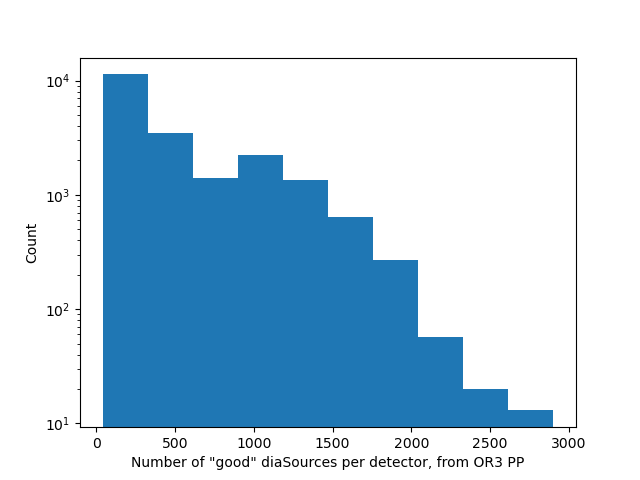

In [42]:
plt.figure()
plt.hist(df.count_1, log=True)
plt.xlabel('Number of "good" diaSources per detector, from OR3 PP')
plt.ylabel('Count')
plt.show()

In [43]:
min(df.count_1)

39

In [44]:
df

,visit,detector,count_1
0,7024040200001,0,198
1,7024040200001,1,182
2,7024040200001,2,204
3,7024040200001,3,204
4,7024040200001,4,179
...,...,...,...
20780,7024040400780,4,428
20781,7024040400780,5,441
20782,7024040400780,6,422
20783,7024040400780,7,466


In [45]:
max(df.count_1)

2902

In [46]:
df.loc[df.count_1 > 2000]

,visit,detector,count_1
4528,7024040200509,2,2024
4726,7024040200533,2,2016
5344,7024040200602,8,2381
5371,7024040200605,8,2498
5389,7024040200609,0,2619
...,...,...,...
20231,7024040400719,4,2374
20232,7024040400719,5,2150
20233,7024040400719,6,2460
20234,7024040400719,7,2220


In [47]:
np.median(df.count_1)

296.0

### Finally, print out stats and make per-patch plots for a handful of the DRP associated diaSource tables

This is what I mean when I say "this should turn into a metric eventually"

In [38]:
miniTractPatchList = validDataIdList[::150]
miniTractPatchList.append({'skymap': 'ops_rehersal_prep_2k_v1', 'tract': 9813, 'patch': 180})
miniTractPatchList.append({'skymap': 'ops_rehersal_prep_2k_v1', 'tract': 9813, 'patch': 181})
print(miniTractPatchList)

[{skymap: 'ops_rehersal_prep_2k_v1', tract: 2494, patch: 85}, {skymap: 'ops_rehersal_prep_2k_v1', tract: 2495, patch: 254}, {skymap: 'ops_rehersal_prep_2k_v1', tract: 3384, patch: 52}, {skymap: 'ops_rehersal_prep_2k_v1', tract: 3385, patch: 203}, {skymap: 'ops_rehersal_prep_2k_v1', tract: 6914, patch: 188}, {skymap: 'ops_rehersal_prep_2k_v1', tract: 7149, patch: 78}, {skymap: 'ops_rehersal_prep_2k_v1', tract: 7445, patch: 246}, {skymap: 'ops_rehersal_prep_2k_v1', tract: 9590, patch: 2}, {skymap: 'ops_rehersal_prep_2k_v1', tract: 9813, patch: 74}, {skymap: 'ops_rehersal_prep_2k_v1', tract: 9880, patch: 20}, {'skymap': 'ops_rehersal_prep_2k_v1', 'tract': 9813, 'patch': 180}, {'skymap': 'ops_rehersal_prep_2k_v1', 'tract': 9813, 'patch': 181}]


There are 194 total diaSources
There are 188 "good" diaSources
There are 7 unique visit+detectors
There are 26.9 "good" diaSources per dataId that went into this tract+patch
There are 167 total diaObjects
	 The diaObject with the most diaSources has 3 diaSources
	 and 141 (84.4%) diaObjects have just 1 diaSource


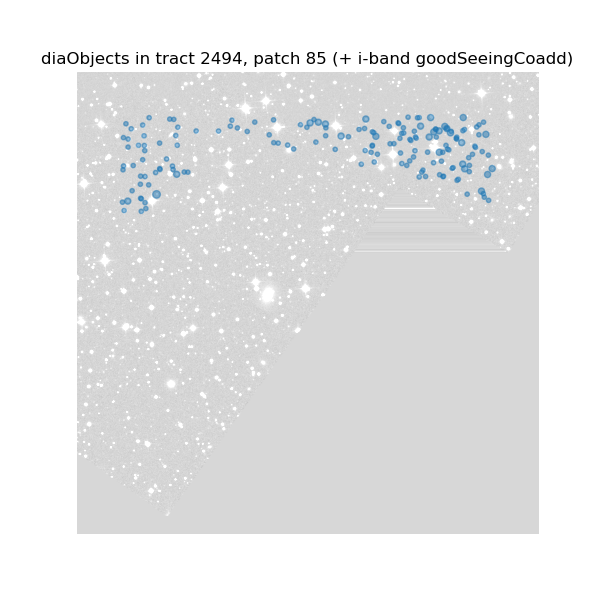

There are 18758 total diaSources
There are 18438 "good" diaSources
There are 204 unique visit+detectors
There are 90.4 "good" diaSources per dataId that went into this tract+patch
There are 2299 total diaObjects
	 The diaObject with the most diaSources has 98 diaSources
	 and 917 (39.9%) diaObjects have just 1 diaSource


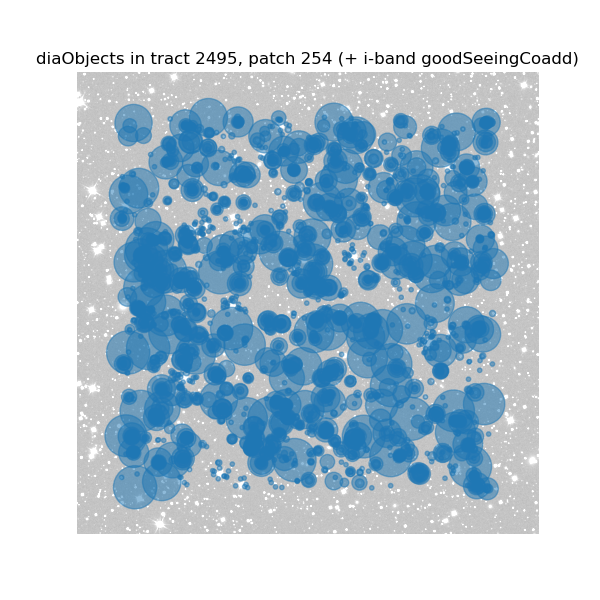

There are 227 total diaSources
There are 219 "good" diaSources
There are 12 unique visit+detectors
There are 18.2 "good" diaSources per dataId that went into this tract+patch
There are 127 total diaObjects
	 The diaObject with the most diaSources has 9 diaSources
	 and 75 (59.1%) diaObjects have just 1 diaSource


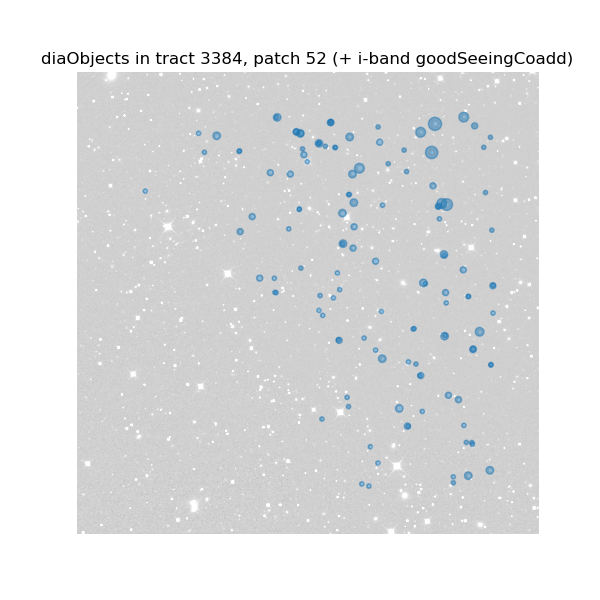

There are 4 total diaSources
There are 4 "good" diaSources
There are 1 unique visit+detectors
There are 4.0 "good" diaSources per dataId that went into this tract+patch
There are 4 total diaObjects
	 The diaObject with the most diaSources has 1 diaSources
	 and 4 (100.0%) diaObjects have just 1 diaSource


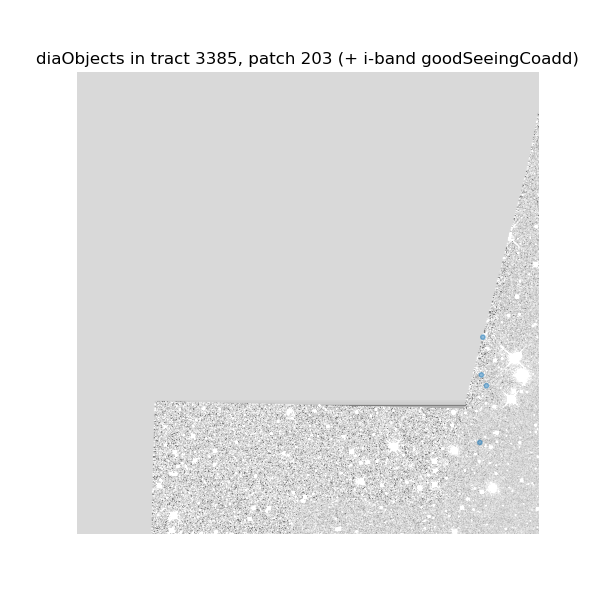

There are 2550 total diaSources
There are 2514 "good" diaSources
There are 86 unique visit+detectors
There are 29.2 "good" diaSources per dataId that went into this tract+patch
There are 717 total diaObjects
	 The diaObject with the most diaSources has 54 diaSources
	 and 399 (55.6%) diaObjects have just 1 diaSource


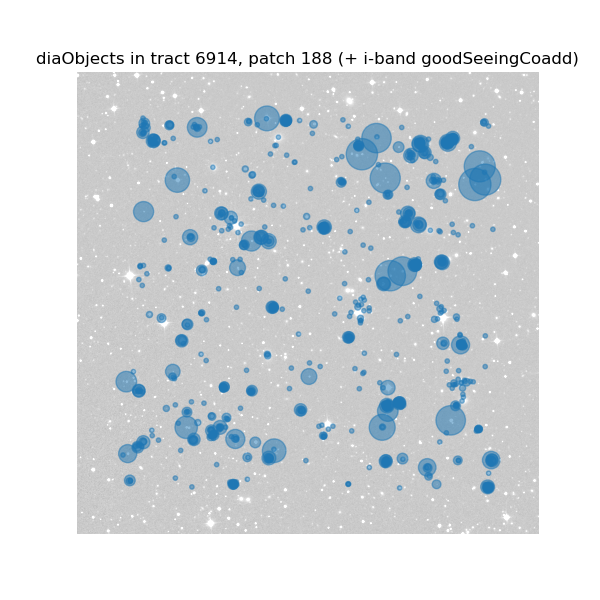

There are 1079 total diaSources
There are 1062 "good" diaSources
There are 38 unique visit+detectors
There are 27.9 "good" diaSources per dataId that went into this tract+patch
There are 427 total diaObjects
	 The diaObject with the most diaSources has 26 diaSources
	 and 269 (63.0%) diaObjects have just 1 diaSource


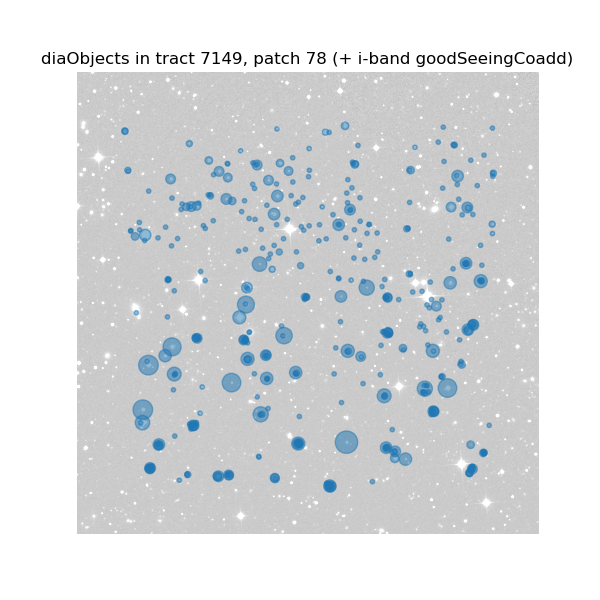

There are 1144 total diaSources
There are 1136 "good" diaSources
There are 43 unique visit+detectors
There are 26.4 "good" diaSources per dataId that went into this tract+patch
There are 599 total diaObjects
	 The diaObject with the most diaSources has 31 diaSources
	 and 464 (77.5%) diaObjects have just 1 diaSource


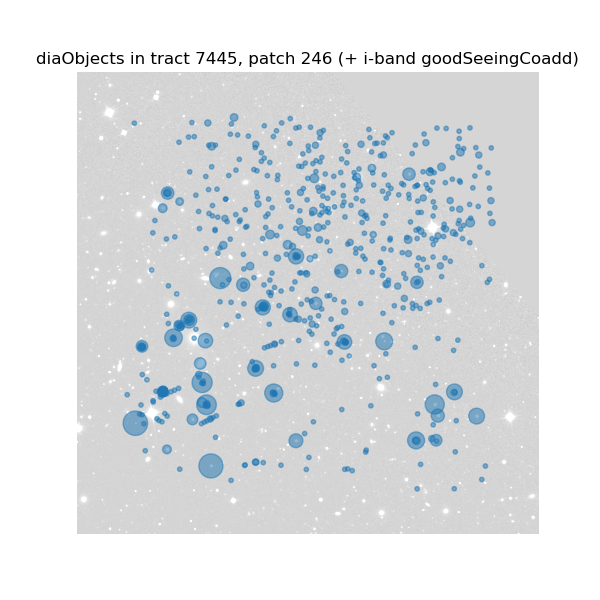

There are 1821 total diaSources
There are 1784 "good" diaSources
There are 183 unique visit+detectors
There are 9.7 "good" diaSources per dataId that went into this tract+patch
There are 616 total diaObjects
	 The diaObject with the most diaSources has 94 diaSources
	 and 260 (42.2%) diaObjects have just 1 diaSource


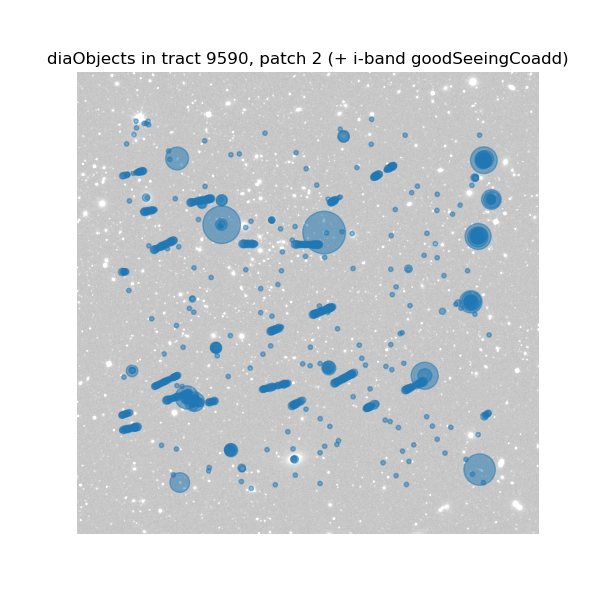

There are 199 total diaSources
There are 195 "good" diaSources
There are 49 unique visit+detectors
There are 4.0 "good" diaSources per dataId that went into this tract+patch
There are 98 total diaObjects
	 The diaObject with the most diaSources has 22 diaSources
	 and 69 (70.4%) diaObjects have just 1 diaSource


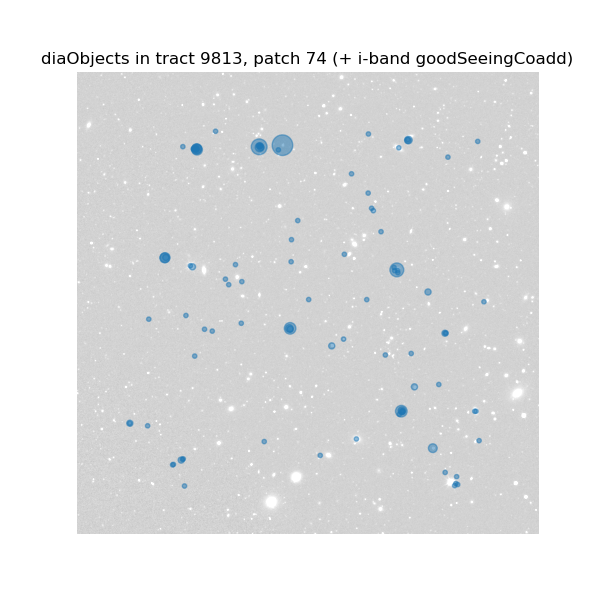

There are 539 total diaSources
There are 525 "good" diaSources
There are 21 unique visit+detectors
There are 25.0 "good" diaSources per dataId that went into this tract+patch
There are 284 total diaObjects
	 The diaObject with the most diaSources has 16 diaSources
	 and 209 (73.6%) diaObjects have just 1 diaSource


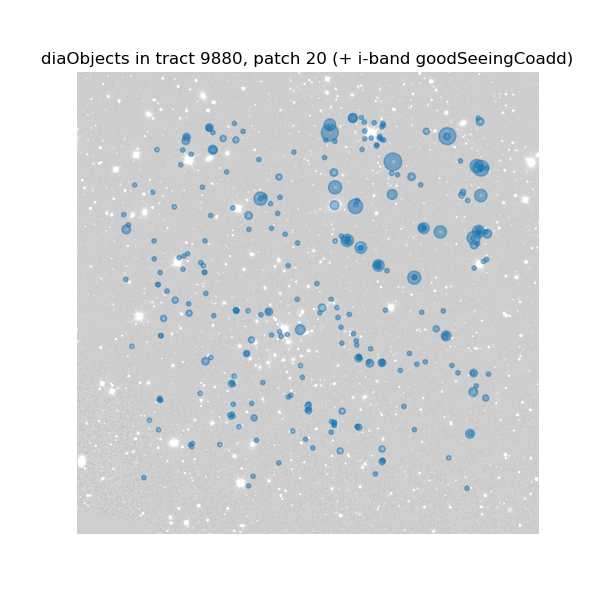

There are 1123 total diaSources
There are 1114 "good" diaSources
There are 177 unique visit+detectors
There are 6.3 "good" diaSources per dataId that went into this tract+patch
There are 331 total diaObjects
	 The diaObject with the most diaSources has 82 diaSources
	 and 251 (75.8%) diaObjects have just 1 diaSource


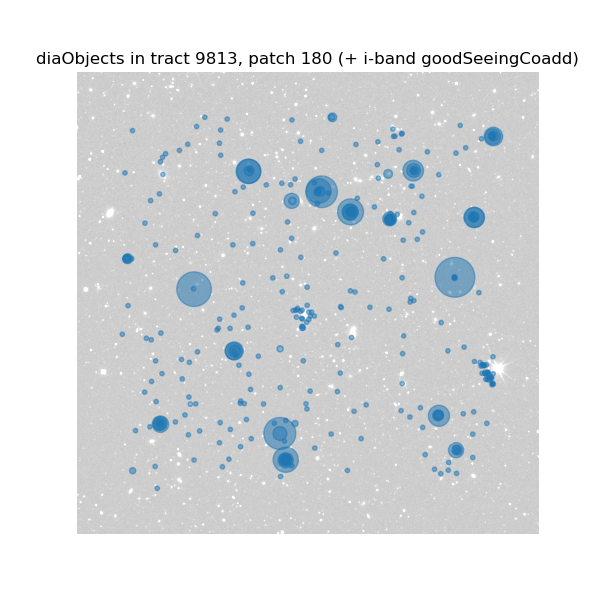

There are 1294 total diaSources
There are 1282 "good" diaSources
There are 161 unique visit+detectors
There are 8.0 "good" diaSources per dataId that went into this tract+patch
There are 379 total diaObjects
	 The diaObject with the most diaSources has 72 diaSources
	 and 221 (58.3%) diaObjects have just 1 diaSource


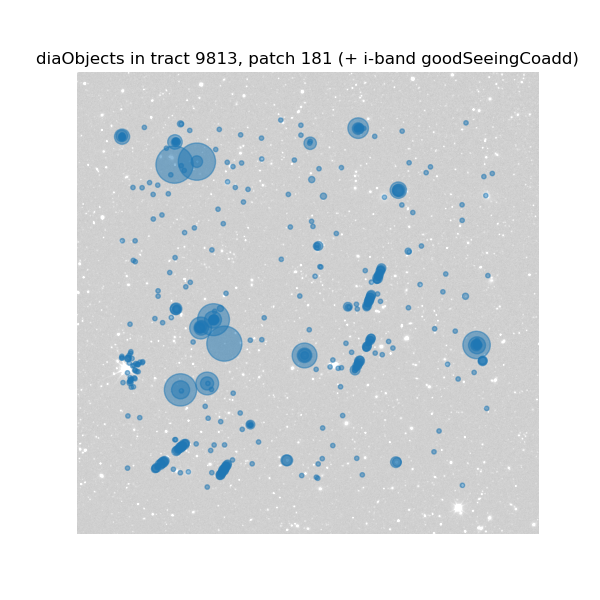

In [49]:
# there are 1500 so this should do 15 of them 
for dataId in miniTractPatchList:
    result = diaSourceCounter(butler=dv_butler, instrument=instrument, tract=dataId['tract'], patch=dataId['patch'],
                              doPrintResults=True, doMakePlot=True)

### Finally-finally, make an all-the-diaObjects-from-the-APDB plot, because is it really a notebook without that?

This one is really fun to pan and zoom around

In [16]:
def plotDiaObjectsOnSky(objTable, objFilter=None, title=None):
    """Create a plot of filtered DIAObjects on the sky.

    Parameters
    ----------
    objTable : `pandas.DataFrame`
        DIA Object Table.
    objFilter : `pandas.Series` of `bool`, optional
        Filter applied to create a subset (e.g., quality cut) from objTable.
    title : `str`, optional
        Title for plot

    Returns
    -------
    fig : `matplotlib.figure.Figure`
        Scatter plot of the DIAObjects on the sky with RA, Dec axes.
        Point sizes and colors correspond to the number of sources per object.
    """
    fig = plt.figure(facecolor='white', figsize=(10, 10))
    ax = fig.add_subplot(111)
    if objFilter:
        plot = ax.scatter(objTable.loc[objFilter, 'ra'],
                          objTable.loc[objFilter, 'dec'], marker='.', lw=0,
                          s=objTable.loc[objFilter, 'nDiaSources']*8,
                          c=objTable.loc[objFilter, 'nDiaSources'],
                          alpha=0.5, cmap='viridis', edgecolor='k')
    else:
        plot = ax.scatter(objTable['ra'],
                          objTable['dec'], marker='.', lw=0,
                          s=objTable['nDiaSources']*8,
                          c=objTable['nDiaSources'],
                          alpha=0.5, cmap='viridis', edgecolor='k')
    plt.xlabel('RA (deg)', size=16)
    plt.ylabel('Dec (deg)', size=16)
    if title:
        plt.title(title, size=16)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.invert_xaxis()  # RA should increase to the left
    cb = fig.colorbar(plot, orientation='horizontal')
    cb.set_label('Number of Sources per Object', size=16)
    #cb.set_clim(np.min(objTable.loc[objFilter, 'nDiaSources']),
    #            np.max(objTable.loc[objFilter, 'nDiaSources']))
    cb.solids.set_edgecolor("face")

In [17]:
pp_object_table_latest = pp_apdb.load_objects(limit=5e6)  # only loads 1e5 by default

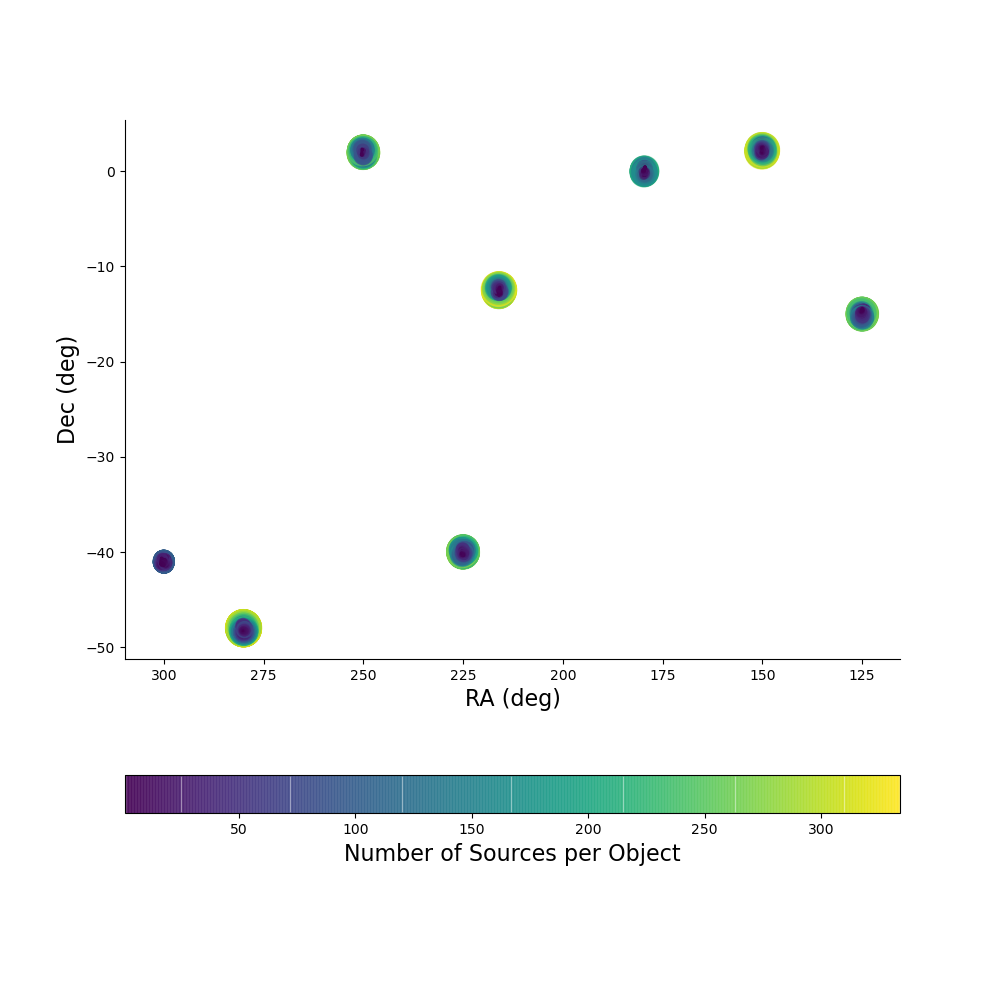

In [19]:
plotDiaObjectsOnSky(pp_object_table_latest)

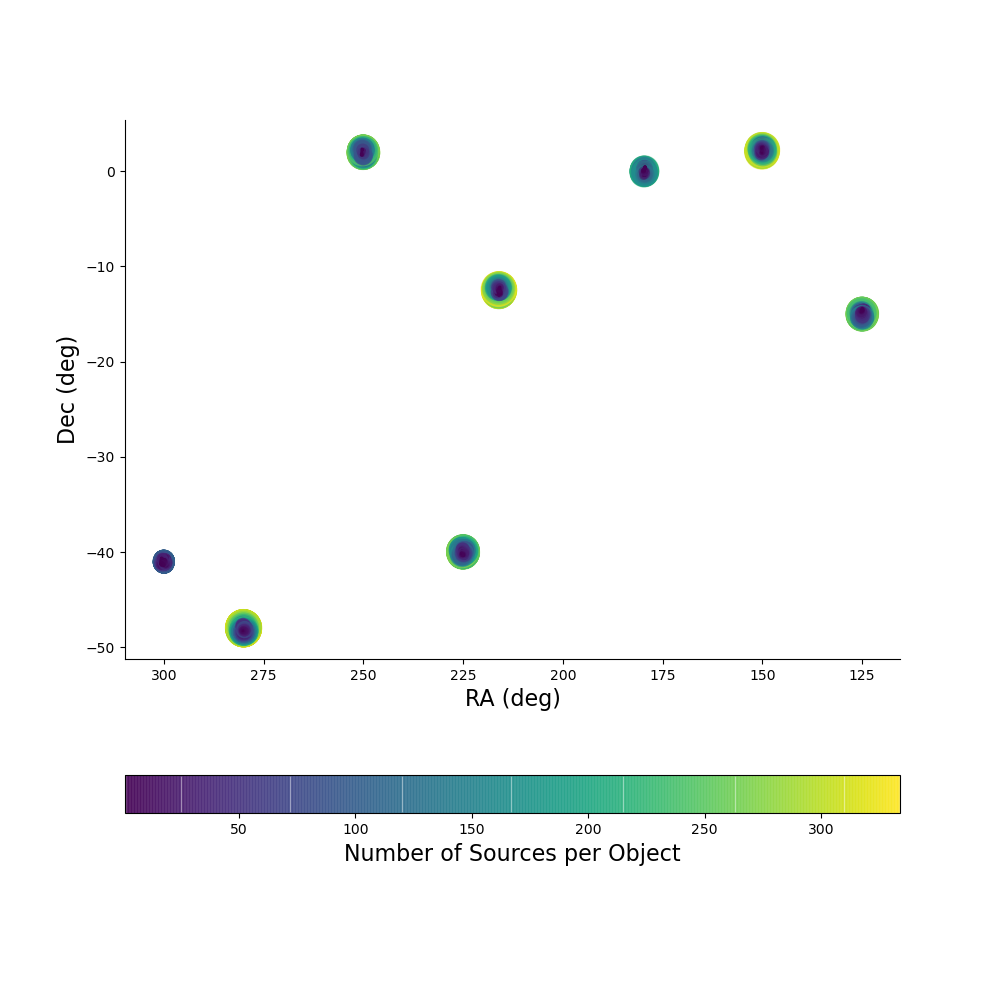

In [20]:
plotDiaObjectsOnSky(pp_object_table_latest)

In [18]:
len(pp_object_table_latest)

1073453

## 6. <a id="section_6">diaSource distribution spot check</a>

Load diffims for the 23 detector+visits we inspected earlier from tract 9813, patches 180-181, and plot the diaSource locations on them.

/tmp/ipykernel_76219/2687958853.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure()


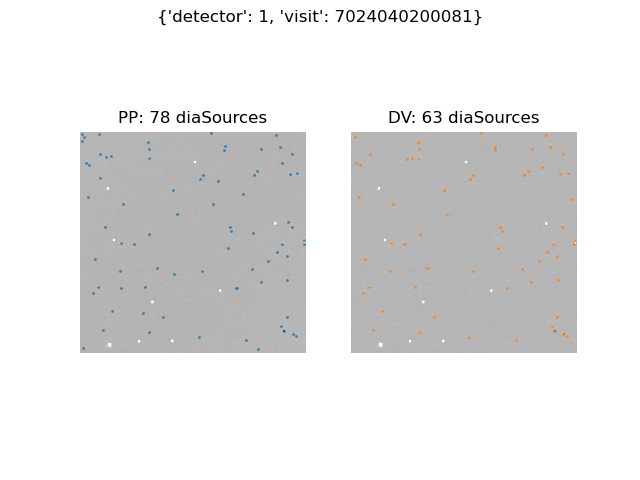

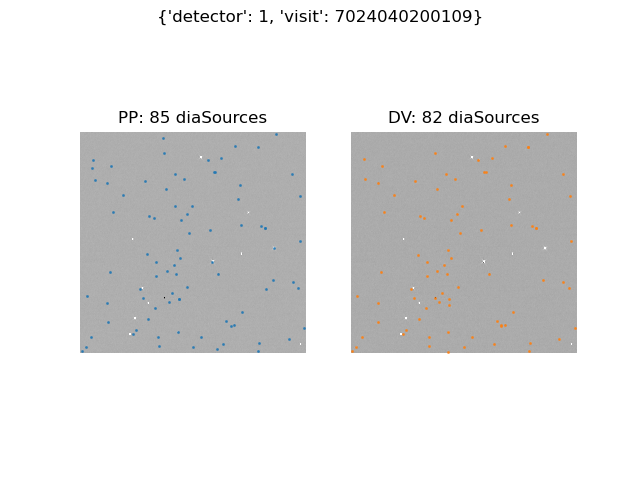

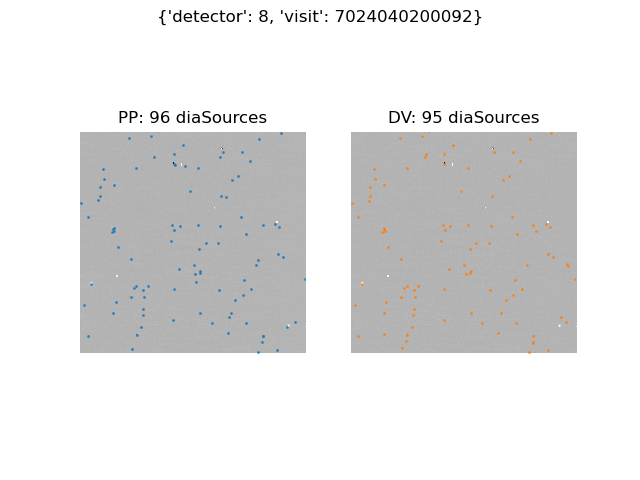

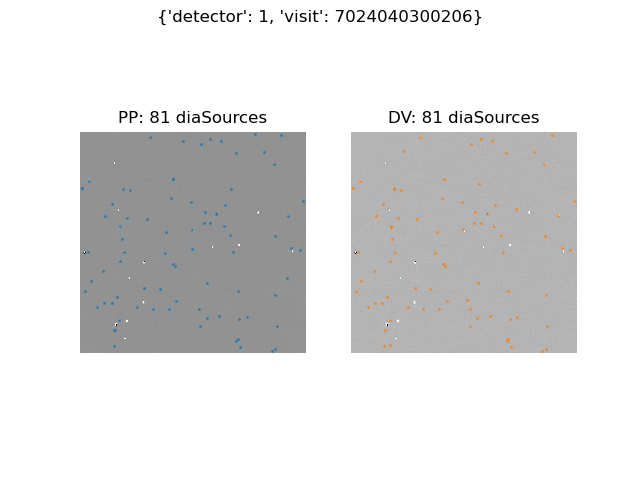

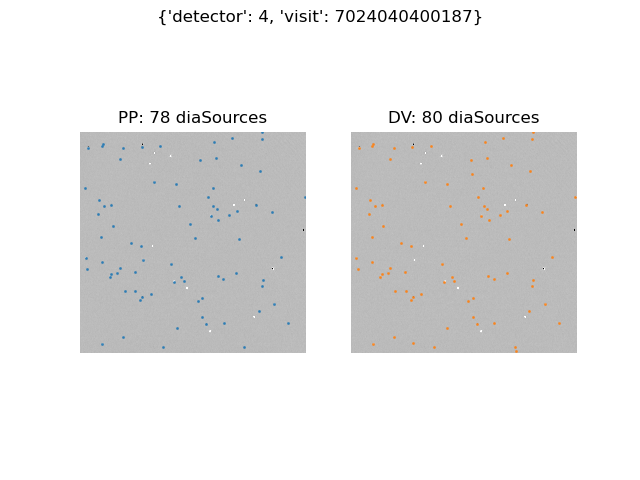

...

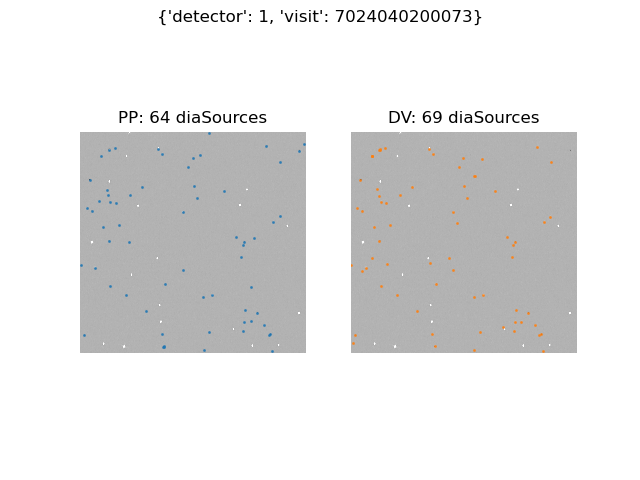

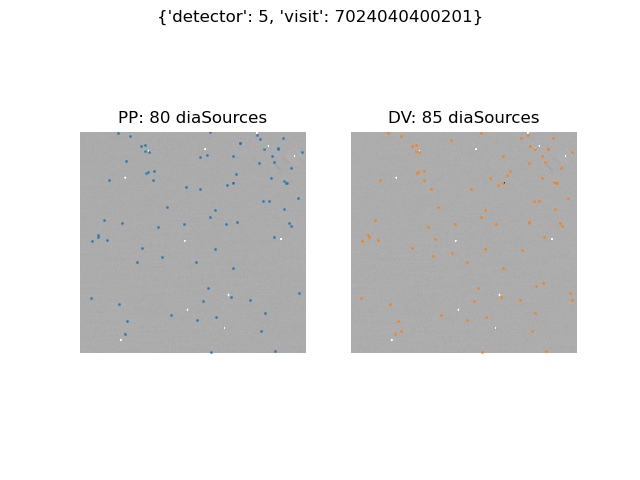

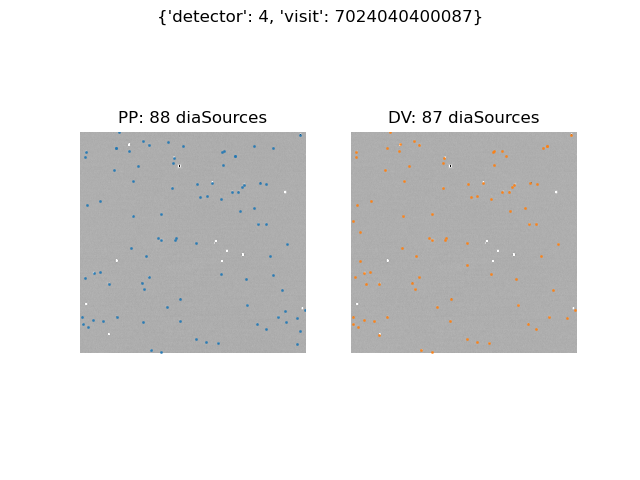

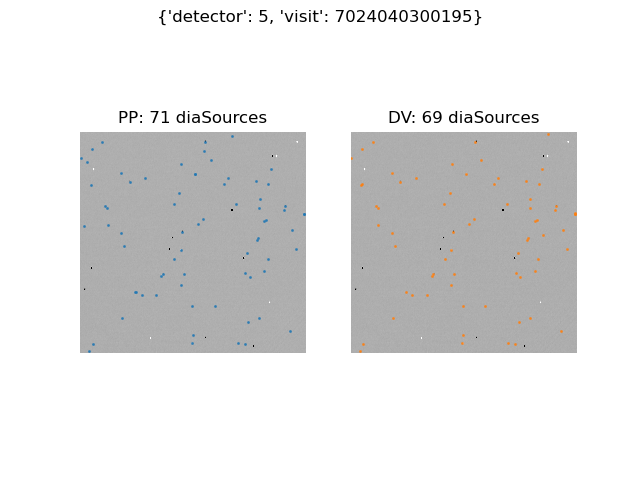

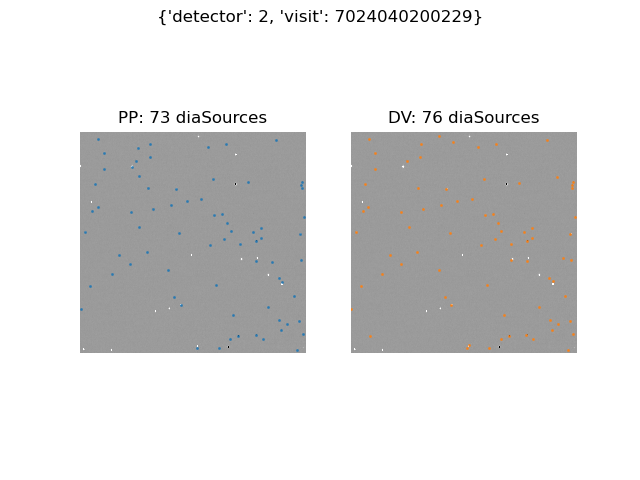

In [20]:
for dataId in ppDataIds_unique[::40]:
    pp_diffim = pp_butler.get('goodSeeingDiff_differenceExp', dataId=dataId)
    dv_diffim = dv_butler.get('goodSeeingDiff_differenceExp', dataId=dataId)
    pp_norm = ImageNormalize(pp_diffim.image.array, interval=ZScaleInterval(), stretch=SqrtStretch())
    dv_norm = ImageNormalize(dv_diffim.image.array, interval=ZScaleInterval(), stretch=SqrtStretch())
    pp_diaSrc = pp_butler.get('goodSeeingDiff_diaSrcTable', dataId=dataId)
    dv_diaSrc = dv_butler.get('goodSeeingDiff_diaSrcTable', dataId=dataId)
    fig = plt.figure()
    fig.suptitle(f'{dataId}')
    ax1 = fig.add_subplot(121)
    ax1.imshow(pp_diffim.image.array, origin='lower', norm=pp_norm, cmap='gray')
    ax1.scatter(pp_diaSrc.x, pp_diaSrc.y, c='C0', marker='.', s=5, alpha=0.7)
    ax1.set_title(f'PP: {len(pp_diaSrc)} diaSources')
    plt.axis('off')
    ax2 = fig.add_subplot(122)
    ax2.imshow(dv_diffim.image.array, origin='lower', norm=dv_norm, cmap='gray')
    ax2.scatter(dv_diaSrc.x, dv_diaSrc.y, c='C1', marker='.', s=5, alpha=0.7)
    ax2.set_title(f'DV: {len(dv_diaSrc)} diaSources')
    plt.axis('off')